# Coursework 2: Generative Models

## Instructions

### Submission
Please submit one zip file on cate - *CW2.zip* containing the following:
1. A version of this notebook containing your answers. Write your answers in the cells below each question. **Please deliver the notebook including the outputs of the cells**
2. Your trained VAE model as *VAE_model.pth*
3. Your trained Generator and Discriminator: *DCGAN_model_D.pth and DCGAN_model_G.pth*


### Training
Training the GAN will take quite a long time (multiple hours), please refer to the 4 GPU options detailed in the logistics lecture. Some additional useful pointers:
* PaperSpace [guide if you need more compute](https://hackmd.io/@afspies/S1stL8Qnt)
* Lab GPUs via SSH.  The VSCode Remote Develop extension is recommended for this. For general Imperial remote working instructions see [this post](https://www.doc.ic.ac.uk/~nuric/teaching/remote-working-for-imperial-computing-students.html). You'll also want to [setup your environment as outlined here](https://hackmd.io/@afspies/Bkd7Zq60K).
* Use Colab and add checkpointing to the model training code; this is to handle the case where colab stops a free-GPU kernel after a certain number of hours (~4).
* Use Colab Pro - If you do not wish to use PaperSpace then you can pay for Colab Pro. We cannot pay for this on your behalf (this is Google's fault).


### Testing
TAs will run a testing cell (at the end of this notebook), so you are required to copy your data ```transform``` and ```denorm``` functions to a cell near the bottom of the document (it is demarkated). You are advised to check that your implementations pass these tests (in particular, the jit saving and loading may not work for certain niche functions)

### General
You can feel free to add architectural alterations / custom functions outside of pre-defined code blocks, but if you manipulate the model's inputs in some way, please include the same code in the TA test cell, so our tests will run easily.

<font color="orange">**The deadline for submission is Monday, 26 Feb by 6 pm** </font>

## Setting up working environment
You will need to install pytorch and import some utilities by running the following cell:

In [1]:
#!pip install -q torch torchvision altair seaborn
#!git clone -q https://github.com/afspies/icl_dl_cw2_utils
from icl_dl_cw2_utils.utils.plotting import plot_tsne
from pathlib import Path
import tqdm

Here we have some default pathing options which vary depending on the environment you are using. You can of course change these as you please.

In [2]:
# Initialization Cell
WORKING_ENV = 'LABS' # Can be LABS, COLAB, PAPERSPACE, SAGEMAKER
USERNAME = 'bc1623' # If working on Lab Machines - Your college username
assert WORKING_ENV in ['LABS', 'COLAB', 'PAPERSPACE', 'SAGEMAKER']

if WORKING_ENV == 'COLAB':
    from google.colab import drive
    %load_ext google.colab.data_table
    dl_cw2_repo_path = 'dl_cw2/' # path in your gdrive to the repo
    content_path = f'/content/drive/MyDrive/{dl_cw2_repo_path}' # path to gitrepo in gdrive after mounting
    data_path = './data/' # save the data locally
    drive.mount('/content/drive/') # Outputs will be saved in your google drive

elif WORKING_ENV == 'LABS':
    content_path = f'/vol/bitbucket/{USERNAME}/dl/dl_cw2/' # You may want to change this
    data_path = f'/vol/bitbucket/{USERNAME}/dl/'
    # Your python env and training data should be on bitbucket
    if 'vol/bitbucket' not in content_path or 'vol/bitbucket' not in data_path:
        import warnings
        warnings.warn(
           'It is best to create a dir in /vol/bitbucket/ otherwise you will quickly run into memory issues'
           )
elif WORKING_ENV == 'PAPERSPACE': # Using Paperspace
    # Paperspace does not properly render animated progress bars
    # Strongly recommend using the JupyterLab UI instead of theirs
    !pip install ipywidgets
    content_path = '/notebooks/'
    data_path = './data/'

elif WORKING_ENV == 'SAGEMAKER':
    content_path = '/home/studio-lab-user/sagemaker-studiolab-notebooks/dl/'
    data_path = f'{content_path}data/'

else:
  raise NotImplementedError()

content_path = Path(content_path)

## Introduction

For this coursework, you are asked to implement two commonly used generative models:
1. A **Variational Autoencoder (VAE)**
2. A **Deep Convolutional Generative Adversarial Network (DCGAN)**

For the first part you will the MNIST dataset https://en.wikipedia.org/wiki/MNIST_database and for the second the CIFAR-10 (https://www.cs.toronto.edu/~kriz/cifar.html).

Each part is worth 50 points.

The emphasis of both parts lies in understanding how the models behave and learn, however, some points will be available for getting good results with your GAN (though you should not spend too long on this).

# Part 1 - Variational Autoencoder

## Part 1.1 (25 points)
**Your Task:**

a. Implement the VAE architecture with accompanying hyperparameters. More marks are awarded for using a Convolutional Encoder and Decoder.

b. Design an appropriate loss function and train the model.


In [3]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torch.utils.tensorboard import SummaryWriter
import torch.nn.functional as F
import matplotlib.pyplot as plt
import sklearn
from sklearn.manifold import TSNE

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'CW_VAE/'):
    os.makedirs(content_path/'CW_VAE/')

if not os.path.exists(data_path):
    os.makedirs(data_path)

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

Using cuda


---
## Part 1.1a: Implement VAE (25 Points)
### Hyper-parameter selection


In [4]:
# Necessary Hyperparameters
num_epochs = 30
learning_rate = 0.001
batch_size = 64
latent_dim = 20 # Choose a value for the size of the latent space

# Additional Hyperparameters
gen = torch.Generator(device=device)
gen.manual_seed(42)

# (Optionally) Modify transformations on input
transform = transforms.Compose([
    transforms.ToTensor(),
])

# (Optionally) Modify the network's output for visualizing your images
def denorm(x):
    return x

### Data loading


In [5]:
train_dat = datasets.MNIST(
    data_path, train=True, download=True, transform=transform
)
test_dat = datasets.MNIST(data_path, train=False, transform=transform)

loader_train = DataLoader(train_dat, batch_size, shuffle=True)
loader_test = DataLoader(test_dat, batch_size, shuffle=False)

# Don't change
sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[:32, :, :, :]
save_image(fixed_input, content_path/'CW_VAE/image_original.png')

### Model Definition

<figure>
  <img src="https://blog.bayeslabs.co/assets/img/vae-gaussian.png" style="width:60%">
  <figcaption>
    Fig.1 - VAE Diagram (with a Guassian prior), taken from <a href="https://blog.bayeslabs.co/2019/06/04/All-you-need-to-know-about-Vae.html">1</a>.
  </figcaption>
</figure>


You will need to define:
* The hyperparameters
* The constructor
* encode
* reparametrize
* decode
* forward



Hints:
- It is common practice to encode the log of the variance, rather than the variance
- You might try using BatchNorm

In [120]:
# *CODE FOR PART 1.1a IN THIS CELL*
init_channels = 8

class VAE(nn.Module):
    def __init__(self, latent_dim):
        super(VAE, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.latent_dim = latent_dim

        self.encoder_block = nn.Sequential(
            nn.Conv2d(in_channels=1, out_channels=init_channels, kernel_size=3,
                      stride=1, padding=0),
            nn.BatchNorm2d(init_channels),
            nn.ReLU(),
            nn.Conv2d(in_channels=init_channels, out_channels=init_channels*2, kernel_size=3,
                      stride=2, padding=0),
            nn.BatchNorm2d(init_channels*2),
            nn.Conv2d(in_channels=init_channels*2, out_channels=init_channels*4, kernel_size=3,
                      stride=2, padding=0),
            nn.BatchNorm2d(init_channels*4),
            nn.Conv2d(in_channels=init_channels*4, out_channels=init_channels*8, kernel_size=3,
                      stride=2, padding=0),
            nn.BatchNorm2d(init_channels*8),
            nn.ReLU(),
            nn.Conv2d(in_channels=init_channels*8, out_channels=init_channels*8, kernel_size=2,
                      stride=1, padding=0),
            nn.BatchNorm2d(init_channels*8),
            nn.ReLU(),
        )

        self.fc1 = nn.Sequential(
            nn.Linear(init_channels*8, 128),
            nn.ReLU(),
        )

        self.mean_layer = nn.Sequential(
            nn.Linear(128, self.latent_dim)
        )

        self.std_layer = nn.Sequential(
            nn.Linear(128, self.latent_dim)
        )

        self.decoder_block = nn.Sequential(
            nn.ConvTranspose2d(in_channels=self.latent_dim, out_channels=init_channels*16, kernel_size=3,
                               stride=1, padding=0),
            nn.BatchNorm2d(init_channels*16),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=init_channels*16, out_channels=init_channels*8, kernel_size=3,
                               stride=2, padding=0),
            nn.BatchNorm2d(init_channels*8),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=init_channels*8, out_channels=init_channels*4, kernel_size=3,
                               stride=2, padding=0),
            nn.BatchNorm2d(init_channels*4),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=init_channels*4, out_channels=1, kernel_size=2,
                               stride=2, padding=1),
            nn.Sigmoid()
        )

        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

    def encode(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        """Encode input data.

        """
        out = self.encoder_block(x)
        out = out.view(-1, init_channels*8)
        out = self.fc1(out)
        mean = self.mean_layer(out)
        logvar = self.std_layer(out)

        return mean, logvar

        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

    def reparametrize(self, mu, logvar):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################

        # sample from N(0, 1)
        epsilon = torch.randn(mu.shape, device=mu.device)

        # calculate std from var (multiply as is log var)
        logstd = logvar * 0.5

        # tranform epsilon into correct distribution
        z = mu + logstd * epsilon

        z = z.view(-1, self.latent_dim, 1, 1)

        return z

        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

    def decode(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        
        out = self.decoder_block(z)

        return out

        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################

        mu, logvar = self.encode(x)

        z = self.reparametrize(mu, logvar)
        out = self.decode(z)

        return out

        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

model = VAE(latent_dim).to(device)
params = sum(p.numel() for p in model.parameters() if p.requires_grad)
def init_weights(m):
    if type(m) == nn.Linear:
        torch.nn.init.xavier_normal_(m.weight)
        m.bias.data.fill_(0.01)
model.apply(init_weights)
print("Total number of parameters is: {}".format(params))
print(model)
# optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=2, gamma=0.95)

Total number of parameters is: 170681
VAE(
  (encoder_block): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(1, 1))
    (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2))
    (4): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (6): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2))
    (8): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU()
    (10): Conv2d(64, 64, kernel_size=(2, 2), stride=(1, 1))
    (11): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU()
  )
  (fc1): Sequential(
    (0): Linear(in_features=64, out_features=128, bias=True)
    (1): ReLU()
  )
  (mean_layer): Sequential(
    (

In [121]:
#!pip install -q torchinfo
# from torchinfo import summary

# summary(model, input_size=(batch_size, 1, 28, 28))

---

## Part 1.1b: Training the Model (5 Points)

### Defining a Loss
Recall the Beta VAE loss, with an encoder $q$ and decoder $p$:
$$ \mathcal{L}=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$

In order to implement this loss you will need to think carefully about your model's outputs and the choice of prior.

There are multiple accepted solutions. Explain your design choices based on the assumptions you make regarding the distribution of your data.

* Hint: this refers to the log likelihood as mentioned in the tutorial. Make sure these assumptions reflect on the values of your input data, i.e. depending on your choice you might need to do a simple preprocessing step.

* You are encouraged to experiment with the weighting coefficient $\beta$ and observe how it affects your training

In [122]:
# *CODE FOR PART 1.1b IN THIS CELL*
def loss_function_VAE(recon_x, x, mu, logvar, beta):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################

        # loss defined by reconstruction loss and KL divergence
        # reconstruction loss use MSE
        recon_loss =  F.mse_loss(recon_x, x) 
        
        # KL divergence
        kl_divergence = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
        
        loss = recon_loss + beta * kl_divergence
        
        return loss, recon_loss, kl_divergence

        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

model.train()
# <- You may wish to add logging info here

recon_losses = []
kl_divs = []
losses = []
test_recon_losses = []
test_kl_divs = []
test_losses = []
beta = 0.001
sample_test = sample_inputs.to(device)
model.to(device)

writer = SummaryWriter()
for epoch in range(num_epochs):
    # <- You may wish to add logging info here
    with tqdm.tqdm(loader_train, unit="batch") as tepoch:
        for batch_idx, (data, _) in enumerate(tepoch):
            #######################################################################
            #                       ** START OF YOUR CODE **
            #######################################################################
            data = data.to(device) # Need at least one batch/random data with right shape -
                        # This is required to initialize to model properly below
                        # when we save the computational graph for testing (jit.save)
            optimizer.zero_grad()
            mu, logvar = model.encode(data)
            recon_x = model.forward(data)

            loss, recon_loss, kl_divergence = loss_function_VAE(recon_x, data, mu, logvar, beta=beta)
            loss.backward()
            optimizer.step()
            recon_loss=recon_loss.detach().cpu()
            kl_divergence=kl_divergence.detach().cpu()

            # test data
            with torch.no_grad():
                test_mu, test_logvar = model.encode(sample_test)
                test_recon_x = model.forward(sample_test)
                test_loss, test_recon_loss, test_kl_divergence = loss_function_VAE(recon_x, data, mu, logvar, beta=beta)

            #######################################################################
            #                       ** END OF YOUR CODE **
            #######################################################################
            if batch_idx % 20 == 0:
                tepoch.set_description(f"Epoch {epoch}")
                tepoch.set_postfix(loss=loss.item()/len(data), kl_loss=kl_divergence.detach().item()/len(data))

            with torch.no_grad():
                recon_losses.append(recon_loss.detach().cpu())
                kl_divs.append(kl_divergence.detach().cpu())
                losses.append(loss.detach().cpu().numpy())

                test_recon_losses.append(test_recon_loss.detach().cpu())
                test_kl_divs.append(test_kl_divergence.detach().cpu())
                test_losses.append(test_loss.detach().cpu().numpy())

    scheduler.step()

    # save the model
    if epoch == num_epochs - 1:
        with torch.no_grad():
            torch.jit.save(torch.jit.trace(model, (data), check_trace=False),
                content_path/'CW_VAE/VAE_model.pth')

writer.close()

Epoch 29: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 938/938 [00:11<00:00, 80.12batch/s, kl_loss=0.00147, loss=0.000115]


### Loss Explanation
Explain your choice of loss and how this relates to:

* The VAE Prior
* The output data domain
* Disentanglement in the latent space


In [44]:
# Any code for your explanation here (you may not need to use this cell)


I chose to implement a loss which contains two components. The first is the reconstruction loss. This is the mean squared error between the image which was inputted to the encoded and the image produced by the decoded. Minimising this loss ensures that the VAE is able to map images to a latent space and reconstruct them effectively. 

The second component of the loss function is the KL divergence term. This term is a regularisation component of the latent space. The KL divergence measures the difference between the latent space distribution and the prior distribution. It penalises large divergences from the prior therefore helping to keep the latent space smooth and organised as is the Gaussian prior used in this model.

The presence of the KL divergence term encourages disentanglement in the latent space as it essentially introduces a penalty if the distribution of the latent space diverges from the prior which itself is a simple Gaussian distribution. It therefore helps prevent a complex latent space distribution. The effectiveness of the KL divergence term in disentangling the latent space can be seen in the visualisation of the latent space below.

<h2>Part 1.2 (9 points)</h2>

a. Plot your loss curves

b. Show reconstructions and samples

c. Discuss your results from parts (a) and (b)

## Part 1.2a: Loss Curves (3 Points)
Plot your loss curves (6 in total, 3 for the training set and 3 for the test set): total loss, reconstruction log likelihood loss, KL loss (x-axis: epochs, y-axis: loss). If you experimented with different values of $\beta$, you may wish to display multiple plots (worth 1 point).

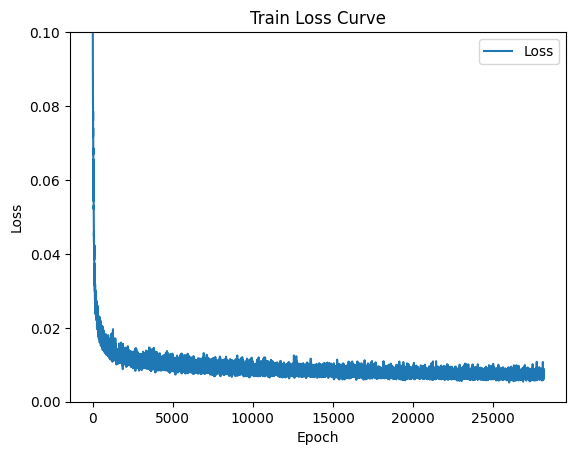

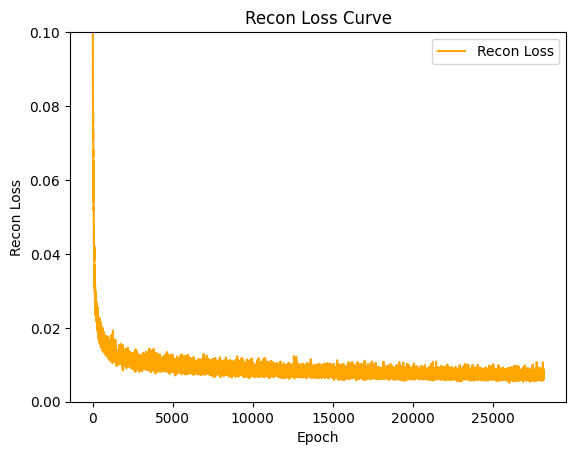

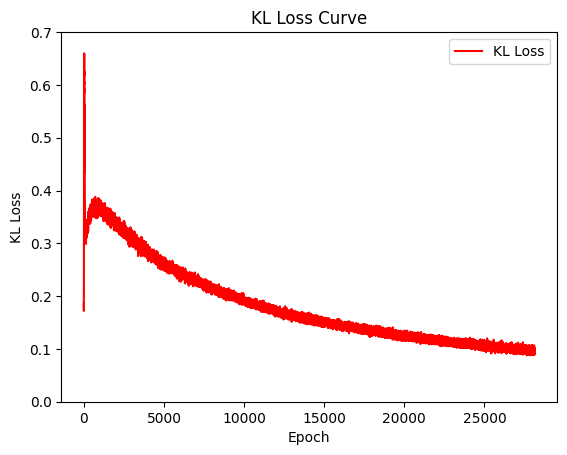

In [127]:
# *CODE FOR PART 1.2a IN THIS CELL*
# losses = [i for i in losses]
# kl_divs = [i for i in kl_divs]
# recon_losses = [i for i in recon_losses]

fig, ax1 = plt.subplots()
ax1.plot(list(range(len(losses))), losses, label='Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.legend()
plt.title('Train Loss Curve')
ax1.set_ylim(top=0.1, bottom=0)
plt.show()

# Plot Recon Loss
fig, ax1 = plt.subplots()
ax1.plot(list(range(len(losses))), recon_losses, label='Recon Loss', color='orange')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Recon Loss')
ax1.legend()
plt.title('Recon Loss Curve')
ax1.set_ylim(top=0.1, bottom=0)
plt.show()

# Plot KL Loss
fig, ax1 = plt.subplots()
ax1.plot(list(range(len(losses))), kl_divs, label='KL Loss', color='red')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('KL Loss')
ax1.legend()
plt.title('KL Loss Curve')
ax1.set_ylim(top=0.7, bottom=0)
plt.show()

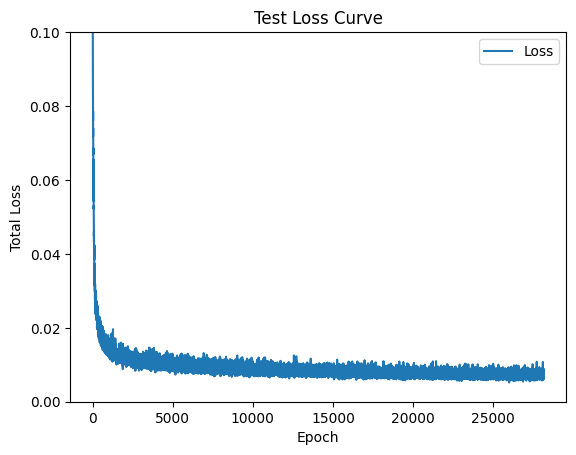

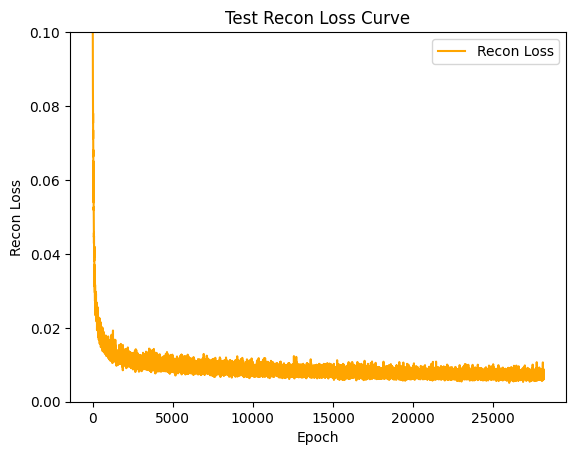

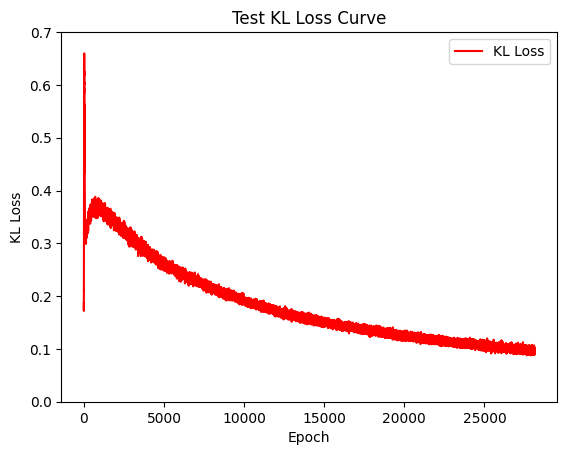

In [126]:
# test_losses = [i for i in test_losses]
# test_kl_divs = [i for i in test_kl_divs]
# test_recon_losses = [i for i in test_recon_losses]

fig, ax1 = plt.subplots()
ax1.plot(list(range(len(losses))), test_losses, label='Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Total Loss')
ax1.legend()
plt.title('Test Loss Curve')
ax1.set_ylim(top=0.1, bottom=0)
plt.show()

# Plot Recon Loss
fig, ax1 = plt.subplots()
ax1.plot(list(range(len(losses))), test_recon_losses, label='Recon Loss', color='orange')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Recon Loss')
ax1.legend()
plt.title('Test Recon Loss Curve')
ax1.set_ylim(top=0.1, bottom=0)
plt.show()

# Plot KL Loss
fig, ax1 = plt.subplots()
ax1.plot(list(range(len(losses))), test_kl_divs, label='KL Loss', color='red')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('KL Loss')
ax1.legend()
plt.title('Test KL Loss Curve')
ax1.set_ylim(top=0.7, bottom=0)
plt.show()

## Part 1.2b: Samples and Reconstructions (6 Points)
Visualize a subset of the images of the test set and their reconstructions **as well as** a few generated samples. Most of the code for this part is provided. You only need to call the forward pass of the model for the given inputs (might vary depending on your implementation).

For reference, here's [some samples from our VAE](https://imgur.com/NwNMuG3).


Input images
--------------------------------------------------
Reconstructed images
--------------------------------------------------
Generated Images
--------------------------------------------------


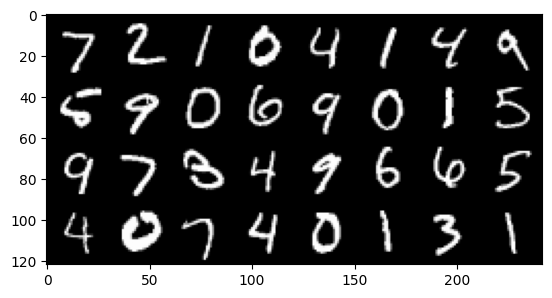

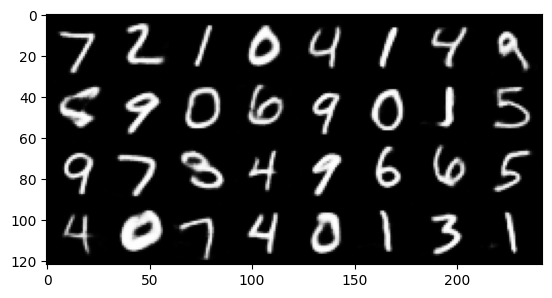

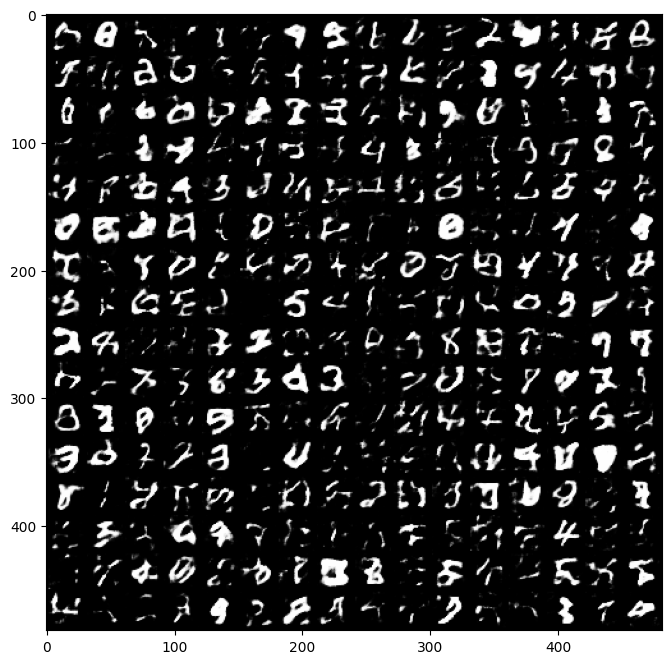

In [125]:
# *CODE FOR PART 1.2b IN THIS CELL*

# load the model
print('Input images')
print('-'*50)

sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[0:32, :, :, :]

# visualize the original images of the last batch of the test set
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                value_range=None, scale_each=False, pad_value=0)
plt.figure()
show(img)

model.to('cpu')

print('Reconstructed images')
print('-'*50)
with torch.no_grad():
    # visualize the reconstructed images of the last batch of test set

    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    recon_batch = model.forward(fixed_input)
    #######################################################################
    #                       ** END OF YOUR CODE **
    #######################################################################

    recon_batch = recon_batch.cpu()
    recon_batch = make_grid(denorm(recon_batch), nrow=8, padding=2, normalize=False,
                            value_range=None, scale_each=False, pad_value=0)
    plt.figure()
    show(recon_batch)

print('Generated Images')
print('-'*50)
model.eval()
n_samples = 256
z = torch.randn(n_samples, latent_dim, 1, 1)
with torch.no_grad():
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    samples = model.decode(z)
    #######################################################################
    #                       ** END OF YOUR CODE **
    #######################################################################

    samples = samples.cpu()
    samples = make_grid(denorm(samples), nrow=16, padding=2, normalize=False,
                            value_range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (8,8))
    show(samples)


Beta 0.5:

![Local Image](beta05latentvis.png "Local Image")

Beta 0:

![Local Image](beta0latentvis.png "Local Image")

### Discussion
Provide a brief analysis of your loss curves and reconstructions:
* What do you observe in the behaviour of the log-likelihood loss and the KL loss (increasing/decreasing)?
* Can you intuitively explain if this behaviour is desirable?
* What is posterior collapse and did you observe it during training (i.e. when the KL is too small during the early stages of training)?
    * If yes, how did you mitigate it? How did this phenomenon reflect on your output samples?
    * If no, why do you think that is?

I observe the log-likelihood (reconstruction loss) fall as the encoder and decoder learn to work together to reproduce the provided images. The value of Beta chosen during training impacts on how the KL loss behaves.
- Beta=0: KL Loss increases during training as reconstruction loss falls. This is because when unconstrained the model will learn a very complex distribution in the latent space i.e. it will become entangled.
- Beta=0.01: KL loss static or slightly increasing during initial epochs but then starts to fall sharply. This is because the reconstruction loss dominates initially and given the trade off relationship between the two causes KL loss to increase slightly initially.
- Beta>0.1: KL loss falls sharply with the reconstruction loss however a degredation in the quality of the reconstructed images is noticed as Beta gets larger.

Posterior collapse is when the model learns to generate the same output regardless of the input to the model. Essentially the model's posterior distribution collapses close to a point. I did notice this during training when I used larger values of Beta in order to disentangle the latent space more. Here for values of Beta above 0.5 the reconstructed images were almost all zeros with some looking like nines. The model was no longer able to decode from the latent space as minimising the KL loss had places too much of a constraint on the distribution of the latent space.

The solution to this was to use a smaller Beta, essentially managing a trade off between a disentangled latent space and clear and diverse image reconstruction.

---
<h2> Part 1.3 (11 points) <h2/>

Qualitative analysis of the learned representations

In this question you are asked to qualitatively assess the representations that your model has learned. In particular:

a. Dimensionality Reduction of learned embeddings

b. Interpolating in the latent space

## Part 1.3a: T-SNE on Embeddings (7 Points)
Extract the latent representations of the test set and visualize them using [T-SNE](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding)  [(see implementation)](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html). You can use a T-SNE implementation from a library such as scikit-learn.

We've provided a function to visualize a subset of the data, but you are encouraged to also produce a matplotlib plot (please use different colours for each digit class).

In [90]:
# *CODE FOR PART 1.3a IN THIS CELL
def create_latent_embeddings(data_loader):
    
    data = torch.tensor([])
    labels = torch.tensor([])
    for batch, batch_y in data_loader:
        data = torch.cat((data, batch), dim=0)
        labels = torch.cat((labels, batch_y), dim=0)

    mu, logvar = model.encode(data)
    z = model.reparametrize(mu, logvar).detach().view(-1, latent_dim)

    z_embedded = TSNE(n_components=2).fit_transform(z)

    return z_embedded, labels

In [91]:
# Interactive Visualization - Code Provided
test_dataloader = DataLoader(test_dat, 10000, shuffle=False)
""" Inputs to the function are
        z_embedded - Embedded X, Y positions for every point in test_dataloader
        test_dataloader - dataloader with batchsize set to 10000
        num_points - number of points plotted (will slow down with >1k)
"""
z_embedded, labels = create_latent_embeddings(test_dataloader)
plot_tsne(z_embedded, test_dataloader, num_points=1000, darkmode=True)


/vol/bitbucket/bc1623/Modules/dlenv/lib/python3.10/site-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.HConcatChart(...)

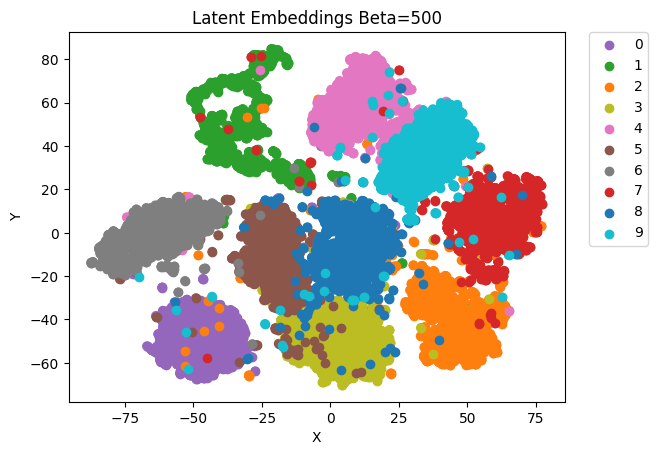

In [93]:
# Custom Visualizations
x = [i[0] for i in z_embedded]
y = [i[1] for i in z_embedded]
label_list = [int(i) for i in labels]
# assign colour to each label
colours = ['#9467bd', '#2ca02c', '#ff7f0e', '#bcbd22', '#e377c2', '#8c564b', '#7f7f7f', '#d62728', '#1f77b4', '#17becf']
c = [colours[i] for i in label_list]
plt.scatter(x, y, c=c)

unique_label_list = set(label_list)
for label in unique_label_list:
    index = [i for i in range(len(label_list)) if label_list[i] == label]
    plt.scatter([x[i] for i in index], [y[i] for i in index], c=colours[label], label=f'{label}')

# Add legend outside the plot to the right
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.title('Latent Embeddings Beta=500')
plt.xlabel('X')
plt.ylabel('Y')
plt.show();

![Local Image](tsnebeta0.png "Local Image")


![Local Image](tsnebeta100.png "Local Image")


![Local Image](tsnebeta500.png "Local Image")

### Discussion
What do you observe? Discuss the structure of the visualized representations.
* What do you observe? What role do the KL loss term and $\beta$ have, if any, in what you observe (multiple matplotlib plots may be desirable here)?
    * Consider Outliers
    * Counsider Boundaries
    * Consider Clusters
* Is T-SNE reliable? What happens if you change the parameters (don't worry about being particularly thorough). [This link](https://distill.pub/2016/misread-tsne/) may be helpful.

Note - If you created multiple plots and want to include them in your discussion, the best option is to upload them to (e.g.) google drive and then embed them via a **public** share link. If you reference local files, please include these in your submission zip, and use relative pathing if you are embedding them (with the notebook in the base directory)

In the TSNE there are clear clusters by image label. The encoder learns to map each input photo to a distinct area in the latent space depending on the which number it is.
Beta controls the contribution of the KL loss term to the overall loss. A higher beta means the KL loss contributes more. This results in a simpler latent space distribution. It encourages the distribution to be similar ot the prior which here is a Gaussian distribution. 
As Beta is increased I noted that all clusters are pulled closer together into a single cluster. This makes sense as this is a simpler distribution which looks closer to the Gaussian prior.
This also explains why the VAE struggles to reconstruct images for very high Beta.
A smaller Beta results in fewer errors or outlier where one colour is in another labels cluster.
However overall i founc my outputs to be relatively insensitive to the value of Beta chosen.

TSNE plots are a useful visualisation but as mentioned in the lined article above they are very sensitive to hyperparameter choice. Also distance in a TSNE plot is not a reliable measure of similarity and cluster size is not reprentative of variation with the cluster.


## Part 1.3b: Interpolating in $z$ (4 Points)
Perform a linear interpolation in the latent space of the autoencoder by choosing any two digits from the test set. What do you observe regarding the transition from on digit to the other?

_hint: Locate the positions in latent space of 2 data points (maybe a one and an eight). Then sample multiple latent space vectors along the line which joins the 2 points and pass them through the decoder._


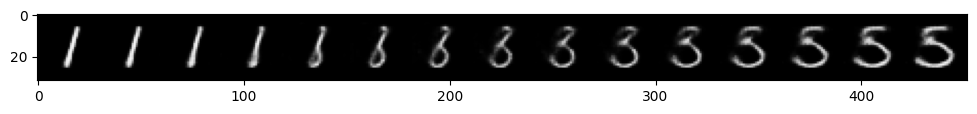

In [75]:
# CODE FOR PART 1.3b IN THIS CELL
n_samples = 15

batch, batch_y = next(iter(test_dataloader))
mu, var = model.encode(batch[[2, 15]])
embeddings = model.reparametrize(mu, var)
labels = batch_y[[2, 15]]

steps = np.linspace(0, 1, num=n_samples, endpoint=True)

new_embeds = [embeddings[0] + step * (embeddings[1] - embeddings[0]) for step in steps]

new_embeds_tensor = torch.tensor([])
for e in new_embeds:
    new_embeds_tensor = torch.cat((new_embeds_tensor, e.unsqueeze(0)), dim=0)

model.eval()
with torch.no_grad():
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    samples = model.decode(new_embeds_tensor)
    #######################################################################
    #                       ** END OF YOUR CODE **
    #######################################################################

    samples = samples.cpu()
    samples = make_grid(denorm(samples), nrow=n_samples, padding=2, normalize=False,
                            value_range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (12,12))
    show(samples)


### Discussion
What did you observe in the interpolation? Is this what you expected?
* Can you relate the interpolation to your T-SNE visualization

Yes, this relates very closely to my TSNE plot. Above i performed a linear interpolation between the handwritten 1 and 5. As we move from 1 to 5 linearly across the latent space we see the one transform into a number that looks like a 2 or slightly like a 7 and then into a number that loosely resembles an 8 before turning into a clear 5. This is interesting because when looking at the my plot of the latent space if you move from the cluster of 1s between the clusters for 2 and 7 and straight through the cluster representing the number 8. Therefore my latent space visualisation and interpolation are in agreement.

# Part 2 - Deep Convolutional GAN

In this task, your main objective is to train a DCGAN (https://arxiv.org/abs/1511.06434) on the CIFAR-10 dataset. You should experiment with different architectures and tricks for stability in training (such as using different activation functions, batch normalization, different values for the hyper-parameters, etc.). In the end, you should provide us with:

- your best trained model (which we will be able to load and run),
- some generations for the fixed latent vectors $\mathbf{z}\sim \mathcal{N}\left(\mathbf{0}, \mathbf{I}\right)$ we have provided you with (train for a number of epochs and make sure there is no mode collapse),
- plots with the losses for the discriminator $D$ and the generator $G$ as the training progresses and explain whether your produced plots are theoretically sensible and why this is (or not) the case.
- a discussion on whether you noticed any mode collapse, where this behaviour may be attributed to, and explanations of what you did in order to cope with mode collapse.

## Part 2.1 (30 points)
**Your Task**:

a. Implement the DCGAN architecture.

b. Define a loss and implement the Training Loop

c. Visualize images sampled from your best model's generator ("Extension" Assessed on quality)

d. Discuss the experimentations which led to your final architecture. You can plot losses or generated results by other architectures that you tested to back your arguments (but this is not necessary to get full marks).


_Clarification: You should not be worrying too much about getting an "optimal" performance on your trained GAN. We want you to demonstrate to us that you experimented with different types of DCGAN variations, report what difficulties transpired throughout the training process, etc. In other words, if we see that you provided us with a running implementation, that you detail different experimentations that you did before providing us with your best one, and that you have grapsed the concepts, you can still get good marks. The attached model does not have to be perfect, and the extension marks for performance are only worth 10 points._

In [4]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torch.optim.lr_scheduler import StepLR, MultiStepLR
import torch.nn.functional as F
import matplotlib.pyplot as plt

mean = torch.Tensor([0.4914, 0.4822, 0.4465])
std = torch.Tensor([0.247, 0.243, 0.261])
unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())

def denorm(x, channels=None, w=None ,h=None, resize = False):

    x = unnormalize(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'CW_GAN'):
    os.makedirs(content_path/'CW_GAN')

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

Using cuda


### Part 2.1a: Implement DCGAN (8 Points)
Fill in the missing parts in the cells below in order to complete the Generator and Discriminator classes. You will need to define:

- The hyperparameters
- The constructors
- `decode`
- `discriminator`

Recomendations for experimentation:
- use the architecture that you implemented for the Autoencoder of Part 1 (encoder as discriminator, decoder as generator).
- use the architecture desribed in the DCGAN paper (https://arxiv.org/abs/1511.06434).

Some general reccomendations:
- add several convolutional layers (3-4).
- accelerate training with batch normalization after every convolutional layer.
- use the appropriate activation functions.
- Generator module: the upsampling can be done with various methods, such as nearest neighbor upsampling (`torch.nn.Upsample`) or transposed convolutions(`torch.nn.ConvTranspose2d`).
- Discriminator module: Experiment with batch normalization (`torch.nn.BatchNorm2d`) and leaky relu (`torch.nn.LeakyReLu`) units after each convolutional layer.

Try to follow the common practices for CNNs (e.g small kernels, max pooling, RELU activations), in order to narrow down your possible choices.

<font color="red">**Your model should not have more than 25 Million Parameters**</font>

The number of epochs that will be needed in order to train the network will vary depending on your choices. As an advice, we recommend that while experimenting you should allow around 20 epochs and if the loss doesn't sufficiently drop, restart the training with a more powerful architecture. You don't need to train the network to an extreme if you don't have the time.

#### Data loading

In [28]:
batch_size = 128  # change that

transform = transforms.Compose([
     transforms.ToTensor(),
     transforms.Normalize(mean=mean, std=std),
])
# note - data_path was initialized at the top of the notebook
cifar10_train = datasets.CIFAR10(data_path, train=True, download=True, transform=transform)
cifar10_test = datasets.CIFAR10(data_path, train=False, download=True, transform=transform)
loader_train = DataLoader(cifar10_train, batch_size=batch_size)
loader_test = DataLoader(cifar10_test, batch_size=batch_size)

Files already downloaded and verified
Files already downloaded and verified


We'll visualize a subset of the test set:

torch.Size([546, 274])


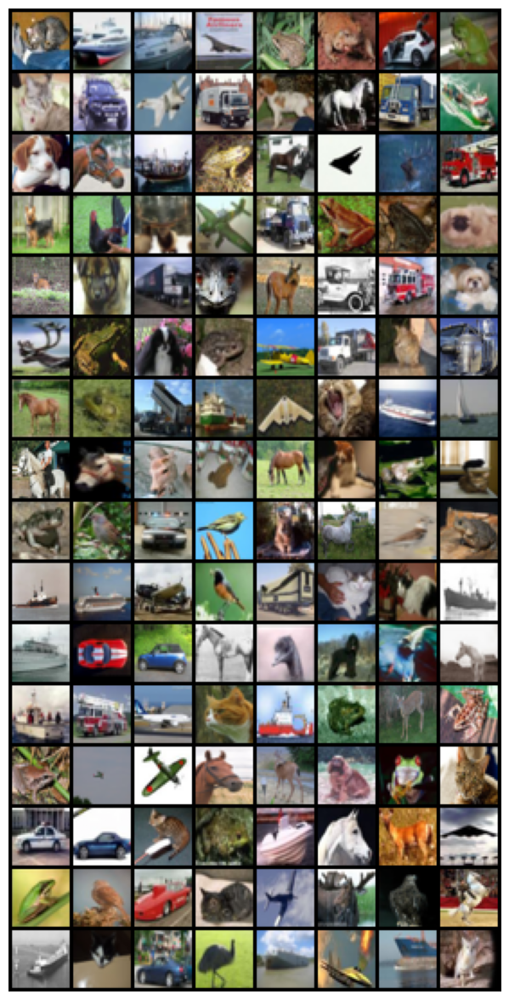

In [29]:
samples, _ = next(iter(loader_test))

samples = samples.cpu()
samples = make_grid(denorm(samples), nrow=8, padding=2, normalize=False,
                        value_range=None, scale_each=False, pad_value=0)
plt.figure(figsize = (15,15))
plt.axis('off')
print(samples[0].shape)
show(samples)

#### Model Definition
Define hyperparameters and the model

In [182]:
# *CODE FOR PART 2.1 IN THIS CELL*

# Choose the number of epochs, the learning rate
# and the size of the Generator's input noise vetor.

num_epochs = 120
g_learning_rate = 0.002
d_learning_rate = 0.0002
latent_vector_size = 100

# Other hyperparams


In [183]:
# *CODE FOR PART 2.1 IN THIS CELL*


class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.latent_dim = latent_vector_size

        self.bright_scale = nn.Parameter(torch.tensor([1], dtype=torch.float, device=device))

        self.decoder_block = nn.Sequential(
            nn.ConvTranspose2d(in_channels=self.latent_dim, out_channels=1024, kernel_size=4,
                               stride=1, padding=0),
            nn.BatchNorm2d(1024),
            nn.ReLU(True),
            # 1024x4x4
            nn.ConvTranspose2d(in_channels=1024, out_channels=512, kernel_size=4,
                               stride=1, padding=0),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.ConvTranspose2d(in_channels=512, out_channels=512, kernel_size=4,
                               stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.ConvTranspose2d(in_channels=512, out_channels=512, kernel_size=4,
                               stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=4,
                               stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(in_channels=256, out_channels=64, kernel_size=3,
                               stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(in_channels=64, out_channels=3, kernel_size=3,
                               stride=1, padding=1),
            nn.Tanh()
        )
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

    # You can modify the arguments of this function if needed
    def forward(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        out = self.decoder_block(z) * self.bright_scale
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################
        return out


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.latent_dim = latent_vector_size

        self.encoder_block_1 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=256, kernel_size=3,
                      stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3,
                      stride=1, padding=0),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3,
                      stride=1, padding=0),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),            
        )

        self.encoder_block_2 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3,
                      stride=1, padding=0),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=512, out_channels=256, kernel_size=3,
                      stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=256, out_channels=1, kernel_size=3,
                      stride=3, padding=0),
            nn.Sigmoid()
        )
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

    # You can modify the arguments of this function if needed
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        int_layer = self.encoder_block_1(x)

        out = self.encoder_block_2(int_layer)
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

        return out, int_layer


In [184]:
#!pip install -q torchinfo
# from torchinfo import summary

#model_G = Generator()#.to(device)
#summary(model_G, input_size=(batch_size, latent_vector_size, 1, 1))

# model_D = Discriminator()#.to(device)
# summary(model_D, input_size=(batch_size, 3, 32, 32))

In [58]:
# import gc
# del model_G
# del model_D
# torch.cuda.empty_cache()
# gc.collect()

10151

<h2> Initialize Model and print number of parameters </h2>

You can use method `weights_init` to initialize the weights of the Generator and Discriminator networks. Otherwise, implement your own initialization, or do not use at all. You will not be penalized for not using initialization.

In [186]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0.2)

In [187]:
use_weights_init = True

model_G = Generator().to(device)
#if use_weights_init:
model_G.apply(weights_init)
params_G = sum(p.numel() for p in model_G.parameters() if p.requires_grad)
print("Total number of parameters in Generator is: {}".format(params_G))
print(model_G)
print('\n')

model_D = Discriminator().to(device)
#if use_weights_init:
model_D.apply(weights_init)
params_D = sum(p.numel() for p in model_D.parameters() if p.requires_grad)
print("Total number of parameters in Discriminator is: {}".format(params_D))
print(model_D)
print('\n')

print("Total number of parameters is: {}".format(params_G + params_D))

Total number of parameters in Generator is: 20670596
Generator(
  (decoder_block): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(1, 1))
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(512, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
    (7): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (13): BatchNorm2d(256, ep

### Part 2.1b: Training the Model (12 Points)

#### Defining a Loss

In [188]:
# You can modify the arguments of this function if needed
def loss_function(out, true):
    loss = F.binary_cross_entropy(out, true)
    return loss

def diversity_penalty(samples):
    n = samples.shape[0]
    samples = samples.view(n, -1)
    norm = torch.linalg.norm(samples.unsqueeze(1) - samples, dim=2, ord=2)
    penalty = norm.mean()

    return penalty


def gen_loss(out, true, int_layer_real, int_layer_fake, samples, beta=1):
    div_penalty = diversity_penalty(samples)
    loss = F.binary_cross_entropy(out, true) + beta * torch.linalg.norm(int_layer_real.view(-1).detach() - int_layer_fake.view(-1).detach(), ord=2) + beta * div_penalty
    return loss

<h3>Choose and initialize optimizers</h3>

In [189]:
# setup optimizer
# You are free to add a scheduler or change the optimizer if you want. We chose one for you for simplicity.
beta1 = 0.5
optimizerD = torch.optim.Adam(model_D.parameters(), lr=d_learning_rate, betas=(beta1, 0.999), weight_decay=1e-4)
optimizerG = torch.optim.Adam(model_G.parameters(), lr=g_learning_rate, betas=(beta1, 0.999))

<h3> Define fixed input vectors to monitor training and mode collapse. </h3>

In [190]:
fixed_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
# Additional input variables should be defined here
real_label = 1
fake_label = 0

#### Training Loop

Complete the training loop below. We've defined some variables to keep track of things during training:
* errD: Loss of Discriminator after being trained on real and fake instances
* errG: Loss of Generator
* D_x: Output of Discriminator for real images
* D_G_z1: Output of Discriminator for fake images (When Generator is not being trained)
* D_G_z2: Output of Discriminator for fake images (When Generator is being trained)

In [192]:
train_losses_G = []
train_losses_D = []


# <- You may wish to add logging info here
writer = SummaryWriter()
for epoch in range(num_epochs):
    # <- You may wish to add logging info here
    with tqdm.tqdm(loader_train, unit="batch") as tepoch:
        for i, data in enumerate(tepoch):
            train_loss_D = 0
            train_loss_G = 0

            #######################################################################
            #                       ** START OF YOUR CODE **
            #######################################################################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))

            # train with real
            model_D.zero_grad()
            real_images = data[0].to(device)
            batch_size = real_images.shape[0]
            label = torch.full((real_images.shape[0],), real_label, dtype=torch.float, device=device)
           
            output, int_layer_real = model_D.forward(real_images)
            output = output.view(-1)
           
            #output = output.view(batch_size, -1)
          
            errD_real = loss_function(output, label)
       
            errD_real.backward()
            D_x = output.mean().item()
            
            # train with fake
            noise = torch.randn(real_images.shape[0], latent_vector_size, 1, 1, device=device)
            fake_images = model_G.forward(noise) #* bright_scale
            label.fill_(fake_label)
       
            output, int_layer_fake = model_D.forward(fake_images.detach())
            output = output.view(-1)
       
            #output= output.view(batch_size, -1)
            errD_fake = loss_function(output, label)
       
            errD_fake.backward()
            D_G_z1 = output.mean().item()

            errD = errD_real + errD_fake

            optimizerD.step()

            train_loss_D = errD.detach().cpu().item()

            # (2) Update G network: maximize log(D(G(z)))
            model_G.zero_grad()
            label.fill_(real_label)
            output = model_D.forward(fake_images)[0].view(-1) 
            #output= output.view(batch_size, -1)
            errG = gen_loss(output, label, int_layer_real, int_layer_fake, fake_images, beta=0.01)
            errG.backward()

            D_G_z2 = output.mean().item()

            optimizerG.step()
            #optimizerbs.step()

            train_loss_G = errG.detach().cpu().item()

            #######################################################################
            #                       ** END OF YOUR CODE **
            #######################################################################
            # Logging
            if i % 50 == 0:
                tepoch.set_description(f"Epoch {epoch}")
                tepoch.set_postfix(D_G_z=f"{D_G_z1:.3f}/{D_G_z2:.3f}", D_x=D_x,
                                  Loss_D=errD.item(), Loss_G=errG.item())

    if epoch == 0:
        save_image(denorm(real_images.cpu()).float(), content_path/'CW_GAN/real_samples.png')
    with torch.no_grad():
        fake = model_G(fixed_noise)
        save_image(denorm(fake.cpu()).float(), str(content_path/'CW_GAN/fake_samples_epoch_%03d.png') % epoch)
    
    train_losses_D.append(train_loss_D / len(loader_train))
    train_losses_G.append(train_loss_G / len(loader_train))

    writer.add_scalar('D_Train/Loss', train_loss_D / len(loader_train), epoch)
    writer.add_scalar('G_Train/Loss', train_loss_G / len(loader_train), epoch)

# save  models
# if your discriminator/generator are conditional you'll want to change the inputs here
torch.jit.save(torch.jit.trace(model_G, (fixed_noise)), content_path/'CW_GAN/GAN_G_model.pth')
torch.jit.save(torch.jit.trace(model_D, (fake)), content_path/'CW_GAN/GAN_D_model.pth')

writer.close()

Epoch 119: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 391/391 [00:32<00:00, 11.90batch/s, D_G_z=0.334/0.060, D_x=0.848, Loss_D=0.641, Loss_G=19.5]


## Part 2.1c: Results (10 Points)
This part is fairly open-ended, but not worth too much so do not go crazy. The table below shows examples of what are considered good samples. Level 3 and above will get you 10/10 points, level 2 will roughly get you 5/10 points and level 1 and below will get you 0/10 points.

<table><tr>
<td>
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=18aWqRAnAVTRDY52y1yHSCdqSxUFRKOS9" width="%30">
    <br>
    <em style="color: grey">Level 1</em>
  </p>
</td>
<td>
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1ymO2-jGAvWeUR2kaj_LxQcGYF1RWNRnw" width="%30">
    <br>
    <em style="color: grey">Level 2</em>
  </p>
</td>
<td>
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=13SW62ekW32NMYtfcdm_dCJJ3ZMOZEZAJ" width="%30">
    <br>
    <em style="color: grey">Level 3</em>
  </p>
</td>
</tr></table>

### Generator samples

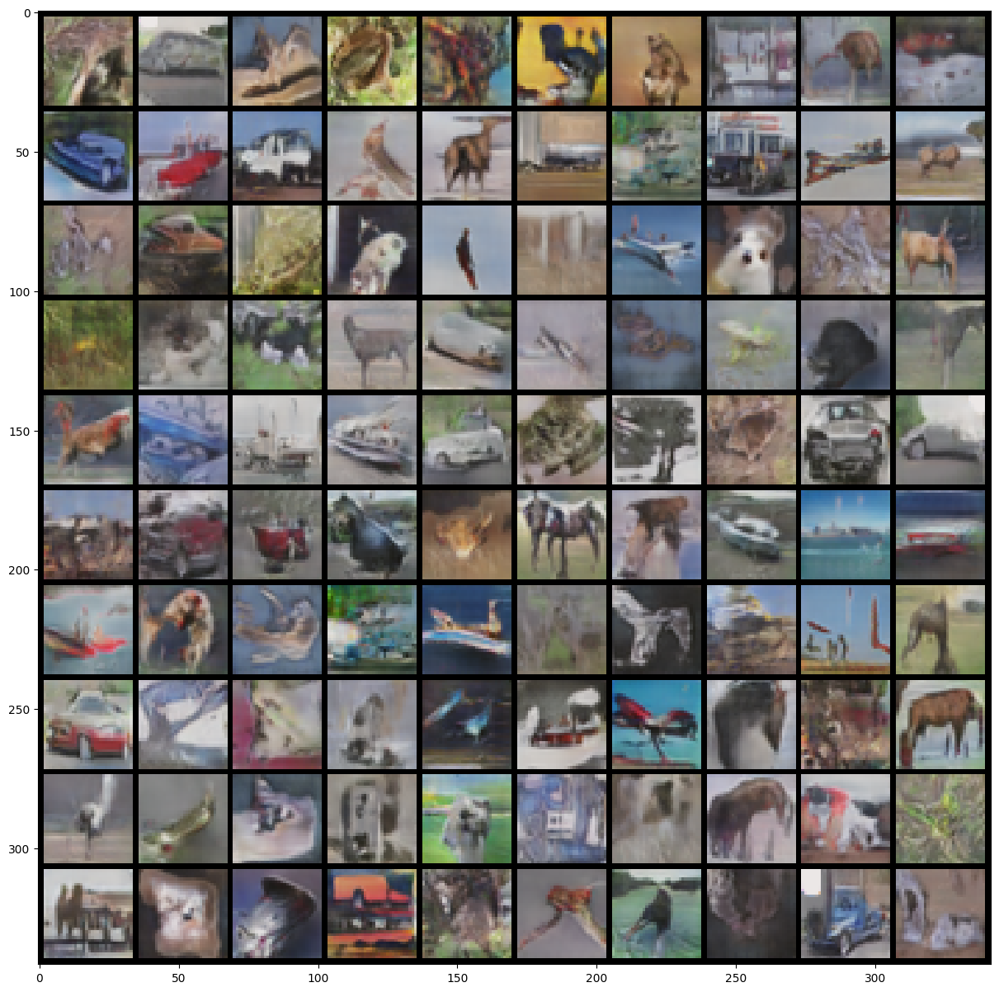

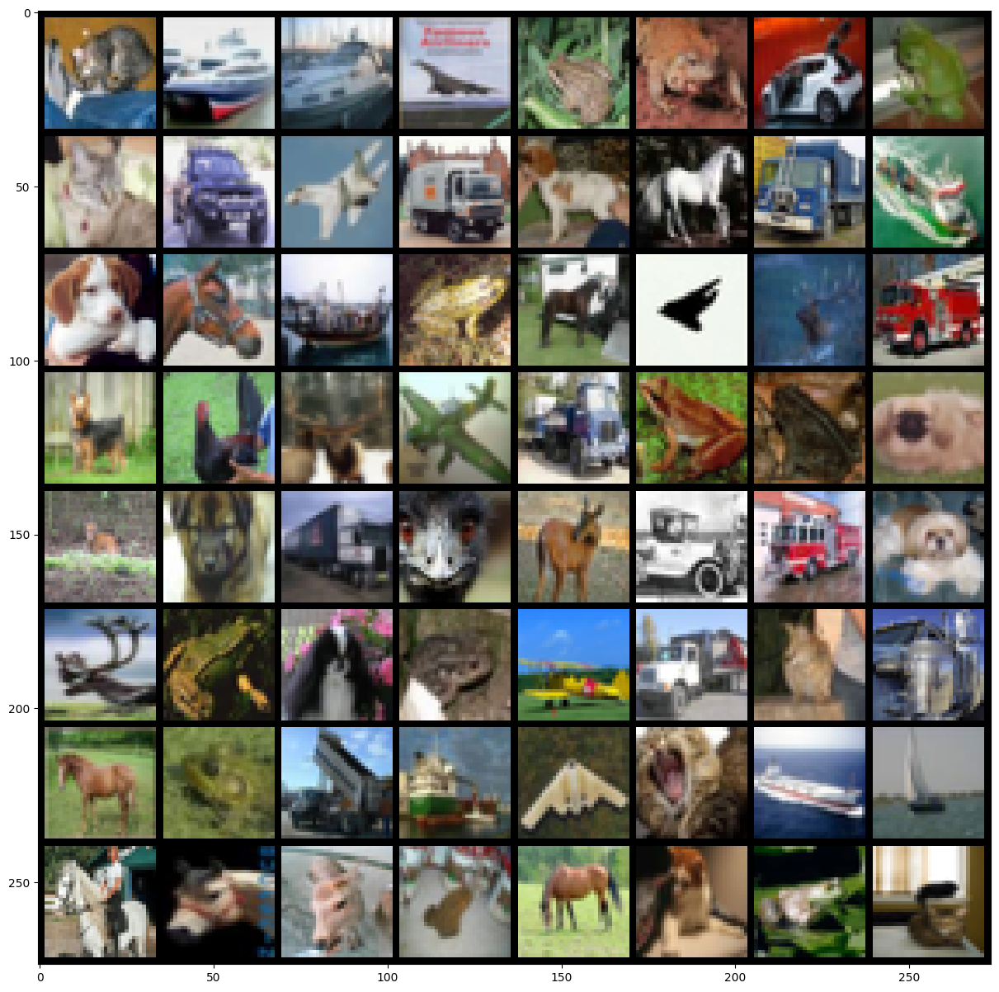

In [193]:
input_noise = torch.randn(100, latent_vector_size, 1, 1, device=device)

with torch.no_grad():
    # visualize the generated images
    generated = model_G(input_noise).cpu()
    generated = make_grid(denorm(generated)[:100], nrow=10, padding=2, normalize=False,
                        value_range=None, scale_each=False, pad_value=0)
    plt.figure(figsize=(15,15))
    save_image(generated, content_path/'CW_GAN/Teaching_final.png')
    show(generated) # note these are now class conditional images columns rep classes 1-10

it = iter(loader_test)
sample_inputs, _ = next(it)
fixed_input = sample_inputs[0:64, :, :, :]
# visualize the original images of the last batch of the test set for comparison
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                value_range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
show(img)

## Part 2.1d: Engineering Choices (10 Points)

Discuss the process you took to arrive at your final architecture. This should include:

* Which empirically useful methods did you utilize
* What didn't work, what worked and what mattered most
* Are there any tricks you came across in the literature etc. which you suspect would be helpful here

I utilised a number of methods which proved effective in training the GAN:
- Different Learning Rates: This proved essential as with equal learning rates I found that the disriminator would quickly get 100% accuracy in classifying real and fake images. Once this happened the generator stopped getting useful feedback on which images it generated were better than others and began to produce uniform white noise images.
- Feature Matching: This proved very effective in getting the generator to learn a diverse set of features. The goal here was to learn to minimise the features learned by the discriminator at an intermediate layer between real and fake images. It encourages the generator to produce images with realistic features present in the diverse set of real images.
- Learnable Scaling Parameter: The final generator activation of tanh is effective but as it only operate on the scale -1 to 1 it did result in images that were noticably more dim than the real images. I decided to included a learnable parameter in the generator model called "bright_scale" which scaled the output of the generator. The idea here was that the discriminator will easily learn to differentiate images if all fakes are more dim than others and so the generatr will learn to produce images with the correct brightness.
- Diversity Penalty: I included a diversity penalty to prevent mode collapse in the generator outputs. This calculated the L2 norm of the differences between each image produce by the generator. If images are similar the L2 norm will be large and will appear as a penalty in the loss term.
- Making Generator much larger than Discriminator

There were also some methods I implemented which i did not find as effective:
- Cosine similarity between features rather than L2 norm: I found that cosine similarity was not as effective in preventing modal collapse perhaps as it was not as effective as comparing smaller features but rather looked at the direction of the image feature vector as a whole.

Another method which I believe would be useful but not implement here was minibatch discrimination.

"Improved Techniques for Training GANs" by Tim Salimans, Ian Goodfellow, Wojciech Zaremba, Vicki Cheung, Alec Radford and Xi Chen was very helpful here.
https://arxiv.org/abs/1606.03498


## Part 2.2: Understanding GAN Training (5 points)


### Loss Curves
**Your task:**


Plot the losses curves for the discriminator $D$ and the generator $G$ as the training progresses and explain whether the produced curves are theoretically sensible and why this is (or not) the case (x-axis: epochs, y-axis: loss).

Make sure that the version of the notebook you deliver includes these results.

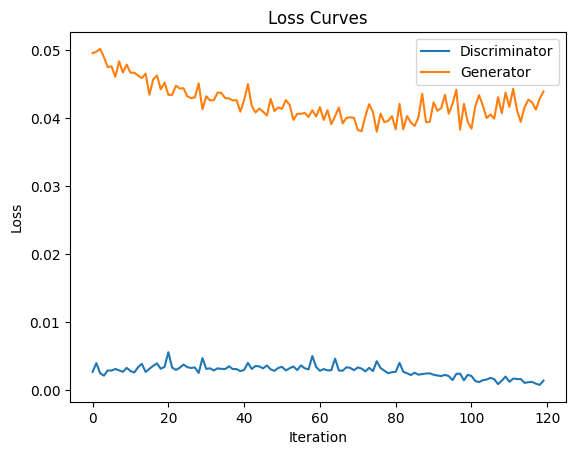

In [194]:
# ANSWER FOR PART 2.2 IN THIS CELL*

plt.plot(list(range(len(train_losses_D))), train_losses_D, label='Discriminator')
plt.plot(list(range(len(train_losses_G))), train_losses_G, label='Generator')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Loss Curves')
plt.legend()
plt.show()

### Discussion

Do your loss curves look sensible? What would you expect to see and why?

I feel the loss curves do look sensible. 
Initially the generators loss falls sharply as image quality improves rapidly at the beginning from producing white noise to incorporating colour and starting to form shapes. At this stage the disriminator only learns to differentiate real and fake images based on very high level features such a colour clustering.
Also learning to minimise the feature matching loss makes the training smoother in the beginning.

The generator loss begins to stagnate after roughly 60 epochs as the disciminator gets better at identifying more nuanced details between real and fake images. The generator finds it harder to improve at the same rate as the generator model does not have enough capacity (circa 20mil parameters) to produce clear, real looking emails.

After this point as the generator gets close to its capacity the discriminator begins to get better at classifying between real and fake images. At this stage it likely learns differenced that the generator struggles to adjust for due to its limited capacity.

Throughout the loss curves for both are volatile and not as smooth as might be seen in training a traditional neural network on a problem. This is reasonable because of the adversarial nature of GAN training. If the disciminator gets better at identifying the generator's outputs the disciminator's loss will fall and the generator's loss will increase and vice versa. This causes the volatile learning curve.

## Part 2.3: Understanding Mode Collapse (5 points)
**Your task:**

Describe the what causes the phenomenon of Mode Collapse and how it may manifest in the samples from a GAN.

Based on the images created by your generator using the `fixed_noise` vector during training, did you notice any mode collapse? what this behaviour may be attributed to, and what did you try to eliminate / reduce it?

In [ ]:
# Any additional code

### Discussion


Mode collapse is caused by the generator learning to output a single image which it feels fools the discriminator. The distribution of outputs from the generator essentially shrinks closer to one point and this causes a lack of diversity in the outputs of the generator.

Mode collapse did not seem to be a major issue for me until I got to the later stages of training. Once some images began to look good and i wanted to train for a little longer to improve some addition images i noticed that the generator would begin producing multiple of the same image. So atlater stages of training i began to experience mode collapse.

One solution would have been to stop training sooner but i wanted to achieve better quality images so I decided to incorporate a diversity penalty into the generator loss function. This essentially penalised the generator for outputting similar images and encouraged diversity. I also implemented feature matching which encouraged the generator to learn to match the actual featur eembeddings of real images rather than focussing on a sole goal of generating outputs that fool the disriminator.

These addition elements to the loss function were very important here as the discriminator was a much smaller model than the generator and perhaps could be outsmarted easily.



# TA Test Cell
TAs will run this cell to ensure that your results are reproducible, and that your models have been defined suitably.

<font color="orange"> <b> Please provide the input and output transformations required to make your VAE and GANs work. If your GAN generator requires more than just noise as input, also specify this below (there are two marked cells for you to inspect) </b></font>


In [128]:
# If you want to run these tests yourself, change directory:
# %cd '.../dl_cw2/'
ta_data_path = "/vol/bitbucket/bc1623/dl/dl_cw2/" # You can change this to = data_path when testing

In [129]:
!pip install -q torch torchvision

In [130]:
# Do not remove anything here
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt

show = lambda img: plt.imshow(np.transpose(img.cpu().numpy(), (1,2,0)))

device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")

# Do not change this cell!
torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

In [131]:
############# CHANGE THESE (COPY AND PASTE FROM YOUR OWN CODE) #############
vae_transform = transforms.Compose([
    transforms.ToTensor(),
])

def vae_denorm(x):
    return x

mean = torch.Tensor([0.4914, 0.4822, 0.4465])
std = torch.Tensor([0.247, 0.243, 0.261])
unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())

def gan_denorm(x, channels=None, w=None ,h=None, resize = False):

    x = unnormalize(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

gan_latent_size = 100

# If your generator requires something other than noise as input, please specify
# two cells down from here

In [132]:
# Load VAE Dataset
test_dat = datasets.MNIST(ta_data_path, train=False, transform=vae_transform,
                          download=True)
vae_loader_test = DataLoader(test_dat, batch_size=32, shuffle=False)

In [133]:
############# MODIFY IF NEEDED #############
vae_input, _ = next(iter(vae_loader_test))

# If your generator is conditional, then please modify this input suitably
input_noise = torch.randn(100, gan_latent_size, 1, 1, device=device)
gan_input = [input_noise] # In case you want to provide a tuple, we wrap ours

Used CNN


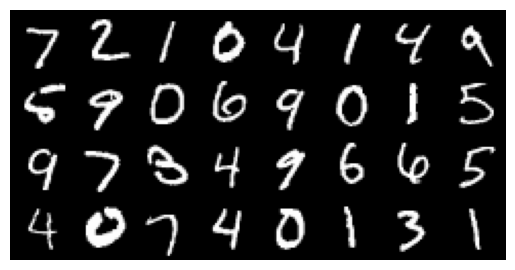

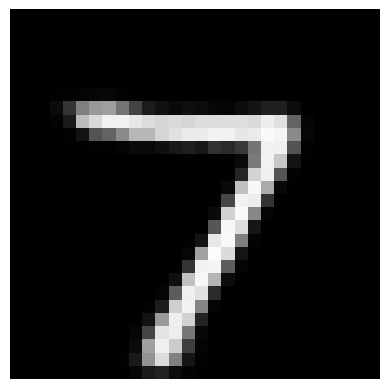

In [134]:
# VAE Tests
# TAs will change these paths as you will have provided the model files manually
"""To TAs, you should have been creating a folder with the student uid
   And the .ipynb + models in the root. Then that path is './VAE_model.pth' etc.
"""
vae = model_G = torch.jit.load(ta_data_path + '/CW_VAE/VAE_model.pth')
vae.eval()

# Check if VAE is convolutional
def recurse_cnn_check(parent, flag):
    if flag:
        return flag
    children = list(parent.children())
    if len(children) > 0:
        for child in children:
            flag = flag or recurse_cnn_check(child, flag)
    else:
        params = parent._parameters
        if 'weight' in params.keys():
            flag = params['weight'].ndim == 4
    return flag

has_cnn = recurse_cnn_check(vae, False)
print("Used CNN" if has_cnn else "Didn't Use CNN")

vae_in = make_grid(vae_denorm(vae_input), nrow=8, padding=2, normalize=False,
                value_range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_in)

vae_test = vae(vae_input.to(device))[0].detach()
vae_reco = make_grid(vae_denorm(vae_test), nrow=8, padding=2, normalize=False,
                value_range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_reco)

Number of Parameters is 24223365 which is ok


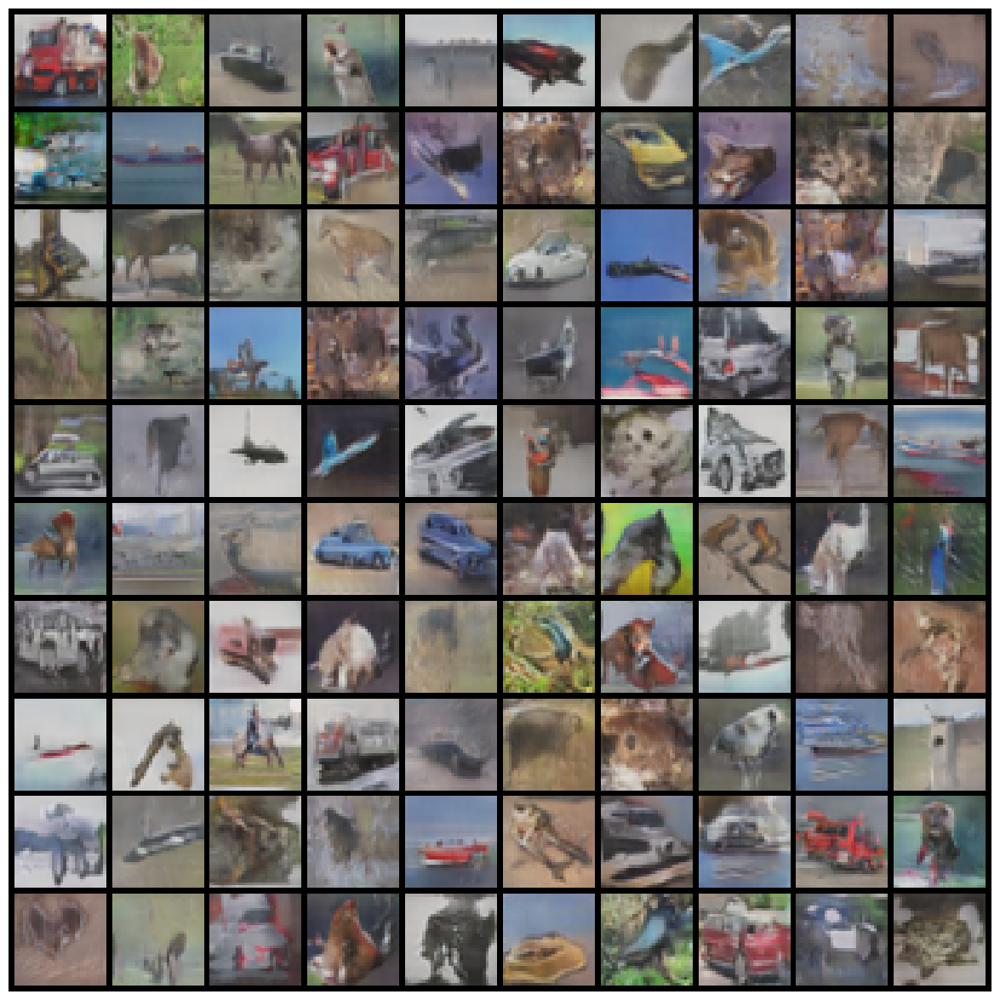

In [135]:
# GAN Tests
model_G = torch.jit.load(ta_data_path + '/CW_GAN/GAN_G_model.pth')
model_D = torch.jit.load(ta_data_path + '/CW_GAN/GAN_D_model.pth')
[model.eval() for model in (model_G, model_D)]

# Check that GAN doesn't have too many parameters
num_param = sum(p.numel() for p in [*model_G.parameters(),*model_D.parameters()])

print(f"Number of Parameters is {num_param} which is", "ok" if num_param<25E+6 else "not ok")

# visualize the generated images
generated = model_G(*gan_input).cpu()
generated = make_grid(gan_denorm(generated)[:100].detach(), nrow=10, padding=2, normalize=False,
                    value_range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
plt.axis('off')
show(generated)

: 